In [1]:
%reload_ext autoreload
%autoreload 2

import sys
import os

import numpy as np
import bloscpack as bp
%matplotlib inline

sys.path.append(os.path.join(os.environ['REPO_DIR'], 'utilities'))
from utilities2015 import *
from metadata import *
from data_manager import *

from mhd_utils_3d import write_meta_header, read_meta_header

/usr/local/lib/python2.7/dist-packages/matplotlib/__init__.py:1357: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Setting environment for Local Macbook Pro


In [2]:
stack_f = 'MD589'
vol_f = DataManager.load_intensity_volume(stack=stack_f)
# vol_f = np.pad(vol_f, 50, mode='constant', constant_values=0).astype(np.uint8)
print vol_f.shape

stack_m = 'MD594'
vol_m = DataManager.load_intensity_volume(stack=stack_m)
# vol_m = np.pad(vol_m, 50, mode='constant', constant_values=0).astype(np.uint8)
print vol_m.shape

(373, 485, 381)
(347, 538, 373)


In [3]:
# Definition of MetaImage
# https://itk.org/Wiki/ITK/MetaIO/Documentation

mhd_f_fp, vol_f_fp = DataManager.get_intensity_volume_metaimage_filepath(stack=stack_f)
create_parent_dir_if_not_exists(mhd_f_fp)

meta_header_f = \
    {
     'BinaryData': 'True',
     'CompressedData': 'False',
     'DimSize': ' '.join(map(str, vol_f.shape[::-1])),
     'ElementDataFile': vol_f_fp,
     'ElementType': 'MET_UCHAR',
     'NDims': '3',
    }
write_meta_header(mhd_f_fp, meta_header_f)
vol_f.tofile(vol_f_fp)

mhd_m_fp, vol_m_fp = DataManager.get_intensity_volume_metaimage_filepath(stack=stack_m)
create_parent_dir_if_not_exists(mhd_m_fp)

meta_header_m = \
    {
     'BinaryData': 'True',
     'CompressedData': 'False',
     'DimSize': ' '.join(map(str, vol_m.shape[::-1])),
     'ElementDataFile': vol_m_fp,
     'ElementType': 'MET_UCHAR',
     'NDims': '3',
    }
write_meta_header(mhd_m_fp, meta_header_m)
vol_m.tofile(vol_m_fp)

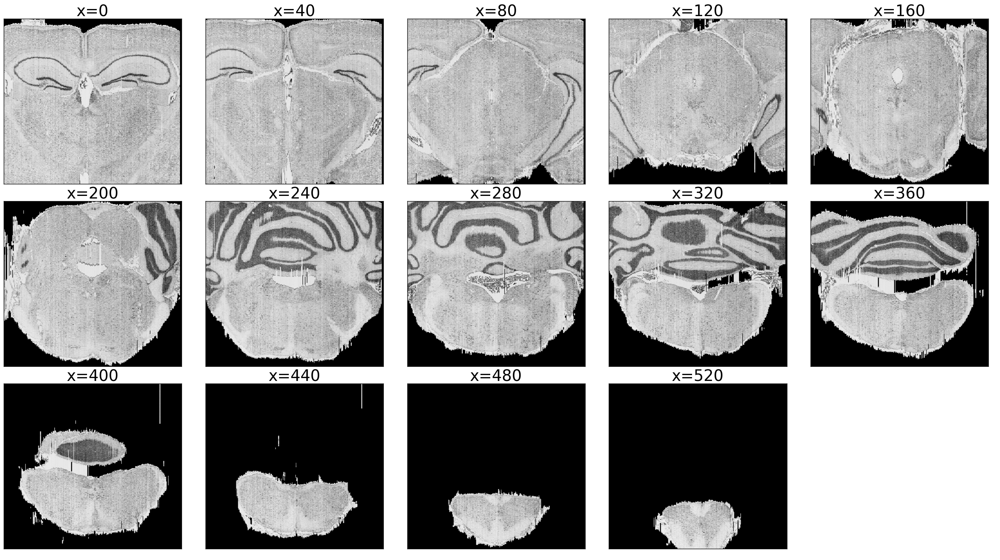

In [4]:
display_volume_sections(vol_m, every=40, cmap=plt.cm.gray, direction='x', start_level=0)

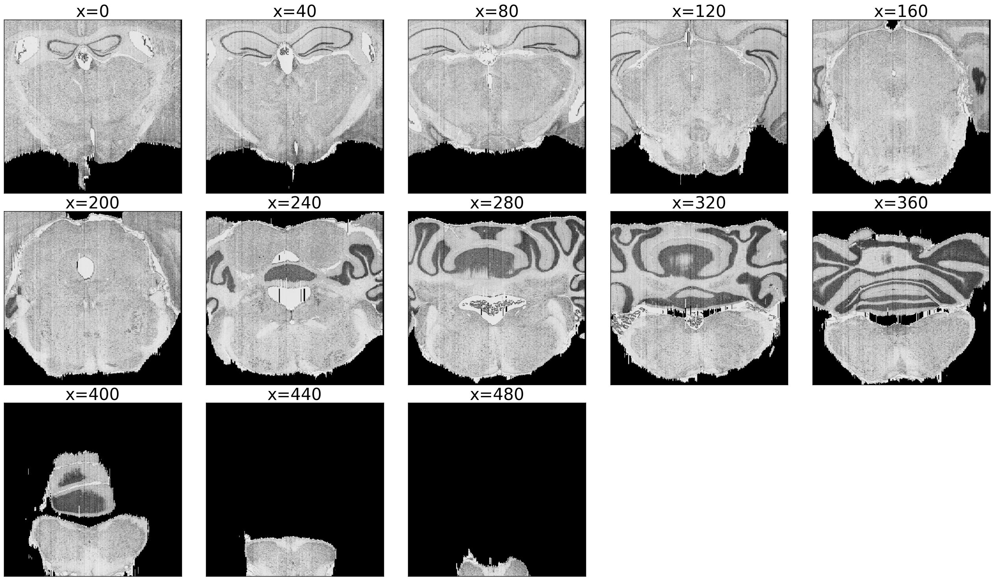

In [5]:
display_volume_sections(vol_f, every=40, cmap=plt.cm.gray, direction='x', start_level=0)

In [7]:
ELASTIX_VOLUMES_ROOTDIR = '/home/yuncong/elastix_3d_registration_output'

In [13]:
tf = 'affine'

In [14]:
params_dir = os.path.join(REPO_DIR, 'preprocess', 'parameters')

if tf == 'rigid':
    param_fp = os.path.join(params_dir, 'Parameters_Rigid_3d.txt')
if tf == 'affine':
    param_fp = os.path.join(params_dir, 'Parameters_Affine_3d.txt')
elif tf == 'bspline':
    param_fp = os.path.join(params_dir, 'Parameters_BSpline_3d.txt')

output_dir = os.path.join(ELASTIX_VOLUMES_ROOTDIR, stack_m + '_alignedTo_' + stack_f + '_' + tf)
create_if_not_exists(output_dir)

cmd = "elastix -f %(vol_f_fp)s -m %(vol_m_fp)s -out %(output_dir)s -p %(param_fp)s" % \
{'param_fp': param_fp, 'output_dir': output_dir, 'vol_f_fp': mhd_f_fp, 'vol_m_fp': mhd_m_fp}
execute_command(cmd)

elastix -f /home/yuncong/CSHL_volumes/MD589/MD589_down32_intensityMetaImageVolume/MD589_down32_intensityMetaImageVolume.mhd -m /home/yuncong/CSHL_volumes/MD594/MD594_down32_intensityMetaImageVolume/MD594_down32_intensityMetaImageVolume.mhd -out /home/yuncong/elastix_3d_registration_output/MD594_alignedTo_MD589_affine -p /home/yuncong/Brain/preprocess/parameters/Parameters_Affine_3d.txt


Child returned 0


0

{'CompressedData': 'False', 'DimSize': '381 485 373', 'BinaryData': 'True', 'ElementSpacing': '1 1 1', 'BinaryDataByteOrderMSB': 'False', 'AnatomicalOrientation': 'RAI', 'Offset': '0 0 0', 'TransformMatrix': '1 0 0 0 1 0 0 0 1', 'NDims': '3', 'ElementType': 'MET_UCHAR', 'ElementDataFile': 'result.0.raw', 'CenterOfRotation': '0 0 0', 'ObjectType': 'Image'}
0 255


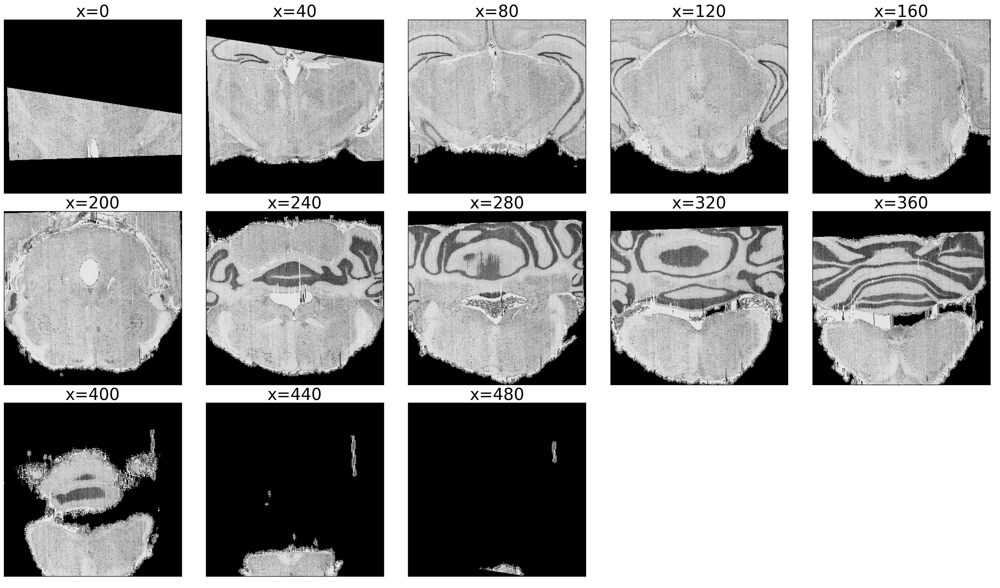

In [15]:
mTof_mhd = read_meta_header(os.path.join(output_dir, 'result.0.mhd'))
print mTof_mhd
vol_mTof_shape = map(int, mTof_mhd['DimSize'].split())

mTof_raw_fp = os.path.join(output_dir, 'result.0.raw')
vol_mTof_data = np.fromfile(mTof_raw_fp, dtype=np.uint8)

vol_mTof = vol_mTof_data.reshape(vol_mTof_shape[::-1])
print vol_mTof.min(), vol_mTof.max()
display_volume_sections(vol_mTof, every=40, cmap=plt.cm.gray, direction='x', start_level=0)

In [16]:
grid_size = 60

vol_mTof_colored = np.zeros(vol_mTof.shape + (3,))
vol_mTof_colored[..., 0] = vol_mTof
vol_f_colored = np.zeros(vol_f.shape + (3,))
vol_f_colored[..., 1] = vol_f

vol_checkerboard_colored = vol_mTof_colored.copy()
for zi, z in enumerate(range(0, vol_mTof.shape[2], grid_size)):
    for yi, y in enumerate(range(0, vol_mTof.shape[0], grid_size)):
        if (zi + yi) % 2 == 1:
            vol_checkerboard_colored[y:y+grid_size, :, z:z+grid_size] = vol_f_colored[y:y+grid_size, :, z:z+grid_size].copy()

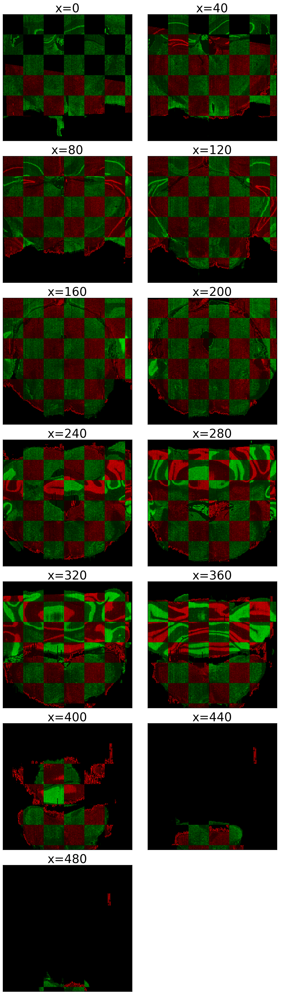

In [17]:
display_volume_sections(vol_checkerboard_colored, every=40, cmap=plt.cm.gray, vmin=0, vmax=255,
                        direction='x', start_level=0, ncols=2)

{'CompressedData': 'False', 'DimSize': '381 485 373', 'BinaryData': 'True', 'ElementSpacing': '1 1 1', 'BinaryDataByteOrderMSB': 'False', 'AnatomicalOrientation': 'RAI', 'Offset': '0 0 0', 'TransformMatrix': '1 0 0 0 1 0 0 0 1', 'NDims': '3', 'ElementType': 'MET_UCHAR', 'ElementDataFile': 'result.0.raw', 'CenterOfRotation': '0 0 0', 'ObjectType': 'Image'}
0 255


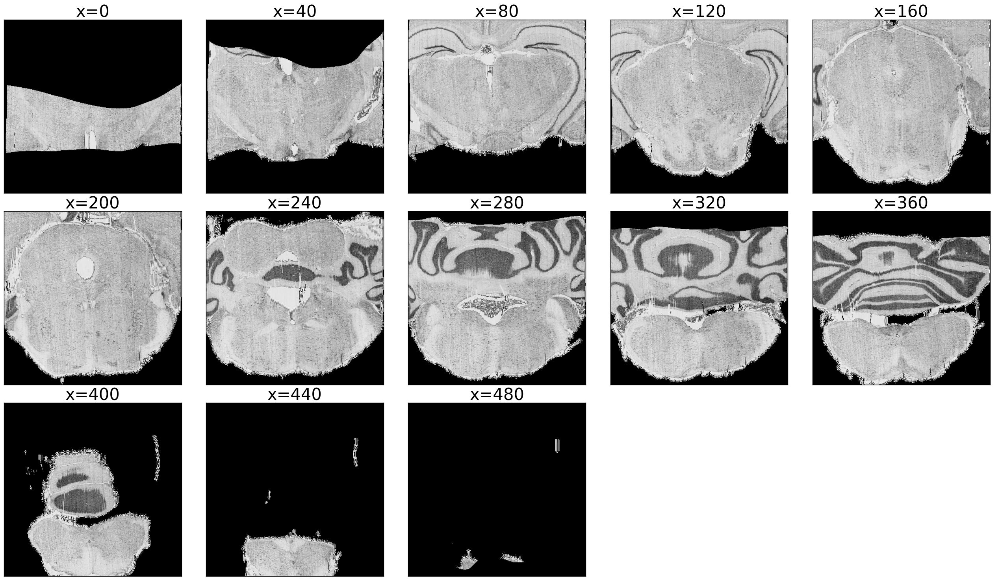

In [9]:
mTof_mhd = read_meta_header(os.path.join(output_dir, 'result.0.mhd'))
print mTof_mhd
vol_mTof_shape = map(int, mTof_mhd['DimSize'].split())

mTof_raw_fp = os.path.join(output_dir, 'result.0.raw')
vol_mTof_data = np.fromfile(mTof_raw_fp, dtype=np.uint8)

vol_mTof = vol_mTof_data.reshape(vol_mTof_shape[::-1])
print vol_mTof.min(), vol_mTof.max()
display_volume_sections(vol_mTof, every=40, cmap=plt.cm.gray, direction='x', start_level=0)

In [106]:
# grid_size = 60
# vol_checkerboard = vol_mTof.copy()
# for zi, z in enumerate(range(0, vol_mTof.shape[2], grid_size)):
#     for yi, y in enumerate(range(0, vol_mTof.shape[0], grid_size)):
#         if (zi + yi) % 2 == 1:
#             vol_checkerboard[y:y+grid_size, :, z:z+grid_size] = vol_f[y:y+grid_size, :, z:z+grid_size].copy()
            
# display_volume_sections(vol_checkerboard, every=40, cmap=plt.cm.gray, vmin=0, vmax=255,
#                         direction='x', start_level=0)

# every = 40
# for x in range(0, vol_checkerboard.shape[1], every):
#     display_images_in_grids([vol_checkerboard[:, x, :], vol_f[:, x, :]], nc=2, cmap=plt.cm.gray)
#     plt.show()

In [10]:
grid_size = 60

vol_mTof_colored = np.zeros(vol_mTof.shape + (3,))
vol_mTof_colored[..., 0] = vol_mTof
vol_f_colored = np.zeros(vol_f.shape + (3,))
vol_f_colored[..., 1] = vol_f

vol_checkerboard_colored = vol_mTof_colored.copy()
for zi, z in enumerate(range(0, vol_mTof.shape[2], grid_size)):
    for yi, y in enumerate(range(0, vol_mTof.shape[0], grid_size)):
        if (zi + yi) % 2 == 1:
            vol_checkerboard_colored[y:y+grid_size, :, z:z+grid_size] = vol_f_colored[y:y+grid_size, :, z:z+grid_size].copy()

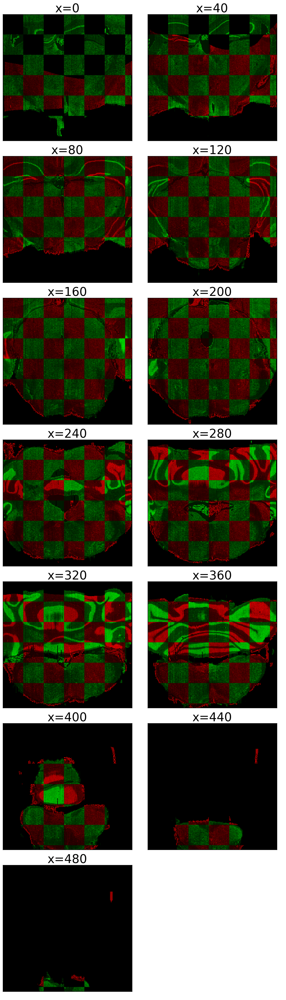

In [11]:
display_volume_sections(vol_checkerboard_colored, every=40, cmap=plt.cm.gray, vmin=0, vmax=255,
                        direction='x', start_level=0, ncols=2)

In [1]:
def parameter_file_to_dict(filename):
    d = {}
    with open(filename, 'r') as f:
        for line in f.readlines():
            if line.startswith('('):
                tokens = line[1:-2].split(' ')
                key = tokens[0]
                if len(tokens) > 2:
                    value = []
                    for v in tokens[1:]:
                        try:
                            value.append(float(v))
                        except ValueError:
                            value.append(v)
                else:
                    v = tokens[1]
                    try:
                        value = (float(v))
                    except ValueError:
                        value = v
                d[key] = value

        return d

def parse_parameter_file(filepath):

    d = parameter_file_to_dict(filepath)

    rot_rad, x_mm, y_mm = d['TransformParameters']
    center = np.array(d['CenterOfRotationPoint']) / np.array(d['Spacing'])
    # center[1] = d['Size'][1] - center[1]

    xshift = x_mm / d['Spacing'][0]
    yshift = y_mm / d['Spacing'][1]

    R = np.array([[np.cos(rot_rad), -np.sin(rot_rad)],
                  [np.sin(rot_rad), np.cos(rot_rad)]])
    shift = center + (xshift, yshift) - np.dot(R, center)
    T = np.vstack([np.column_stack([R, shift]), [0,0,1]])

    return T